# 2.0.0 Kmeans, Kmedoids

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import datetime as dt
import plotly.express as px
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler

from sklearn.cluster import KMeans
from sklearn_extra.cluster import KMedoids 

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
import warnings
warnings.filterwarnings("ignore")

In [3]:
import sys
sys.path.append("../") 

from utils.RFM import rfm_v1
from utils.paths2 import direcciones_cursos

G_raw, G_processed, G_interim, G_external, G_models, G_reports, G_reports_figures = direcciones_cursos('australian')

# Project KMEANS and Kmedoids

In [4]:
df = pd.read_csv(G_raw/'sample.csv')
df['date'] =  pd.to_datetime(df['date'])
df.head()

,invoice,date,customer_id,stockcode,price
0,1,2020-07-25,d18734,y7,50.45
1,2,2020-01-17,c21086,x7,25.30
2,3,2019-07-05,d18185,z5,18.40
3,4,2019-02-26,c18331,z2,5.50
4,5,2019-02-10,b16309,y7,18.40


## 2.2.0 RFM

### 2.2.1 First RFM

In [5]:
rfm, _ = rfm_v1(dataset=df, id_customer='customer_id', date='date', id_facture='invoice', money='price', 
                cut_r=None, 
                cut_f=[0,1,2,3,7,14], 
                cut_m=None
               )

In [6]:
data = rfm.copy()
data = data.loc[:,['id_customer','recency','frequency','monetary']]
data.head()

,id_customer,recency,frequency,monetary
0,a15600,153,3,101.05
1,a15601,170,2,11.00
2,a15602,317,3,106.40
3,a15603,22,3,43.79
4,a15604,7,5,93.49


In [7]:
print(data.mean())

recency      211.228881
frequency      3.029936
monetary      68.532341
dtype: float64


In [8]:
print(data.std())

recency      175.343777
frequency      1.570109
monetary      44.365022
dtype: float64


In [9]:
print(data.describe())

            recency     frequency      monetary
count  33004.000000  33004.000000  33004.000000
mean     211.228881      3.029936     68.532341
std      175.343777      1.570109     44.365022
min        1.000000      1.000000      5.500000
25%       69.000000      2.000000     31.480000
50%      164.000000      3.000000     62.190000
75%      313.250000      4.000000     94.240000
max      731.000000     11.000000    315.690000


### 2.2.2 Detect skewed variables

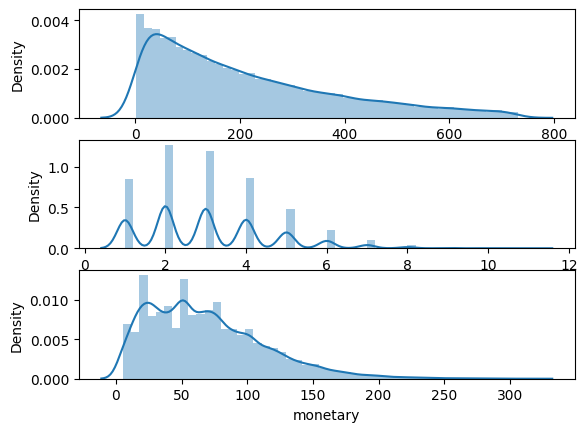

In [10]:
# Plot distribution of var1
plt.subplot(3, 1, 1); sns.distplot(data['recency'])

# Plot distribution of var2
plt.subplot(3, 1, 2); sns.distplot(data['frequency'])

# Plot distribution of var3
plt.subplot(3, 1, 3); sns.distplot(data['monetary'])

# Show the plot
plt.show()

### 2.2.3 Manage skewness

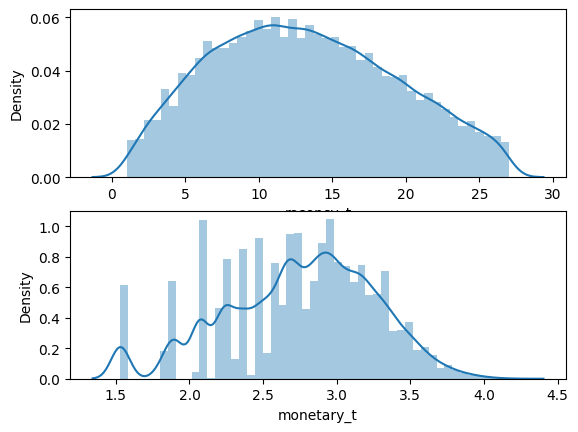

In [11]:
# Apply sqrt transformation to recency
data['recency_t'] = data['recency'] ** (1/2)# np.log(data['recency'])

# Apply sqrt transformation to monetary
data['monetary_t'] = data['monetary'] ** (1/4)

# Create a subplot of the distribution of recency_t
plt.subplot(2, 1, 1); sns.distplot(data['recency_t'])

# Create a subplot of the distribution of monetary_log
plt.subplot(2, 1, 2); sns.distplot(data['monetary_t'])

# Show the plot
plt.show()

### 2.2.4 Center and scale 

In [12]:
data = data.set_index('id_customer')

In [13]:
# Initialize a scaler
scaler = StandardScaler()

# Fit the scaler
scaler.fit(data)

# Scale and center the data
data_normalized = scaler.transform(data)

# Create a pandas DataFrame
data_normalized = pd.DataFrame(data_normalized, index=data.index, columns=data.columns)

# Print summary statistics
print(data_normalized.describe().round(2))

        recency  frequency  monetary  recency_t  monetary_t
count  33004.00   33004.00  33004.00   33004.00    33004.00
mean       0.00      -0.00      0.00       0.00        0.00
std        1.00       1.00      1.00       1.00        1.00
min       -1.20      -1.29     -1.42      -1.96       -2.41
25%       -0.81      -0.66     -0.84      -0.78       -0.75
50%       -0.27      -0.02     -0.14      -0.06        0.11
75%        0.58       0.62      0.58       0.73        0.72
max        2.96       5.08      5.57       2.24        2.89


In [14]:
data_normalized = data_normalized.loc[:,['recency_t','frequency','monetary_t']]
data_normalized.head()

,recency_t,frequency,monetary_t
id_customer,,,
a15600,-0.125734,-0.019066,0.830647
a15601,-0.017701,-0.655974,-1.835411
a15602,0.751843,-0.019066,0.911963
a15603,-1.365588,-0.019066,-0.351083
a15604,-1.695724,1.254750,0.710045


### 2.2.5 Calculate sum of squared errors

In [15]:
sse = {}

# Fit KMeans and calculate SSE for each k
for k in range(2, 15):
  
    # Initialize KMeans with k clusters
    kmeans = KMeans(n_clusters=k, random_state=1)
    
    # Fit KMeans on the normalized dataset
    kmeans.fit(data_normalized)
    
    # Assign sum of squared distances to k element of dictionary
    sse[k] = kmeans.inertia_

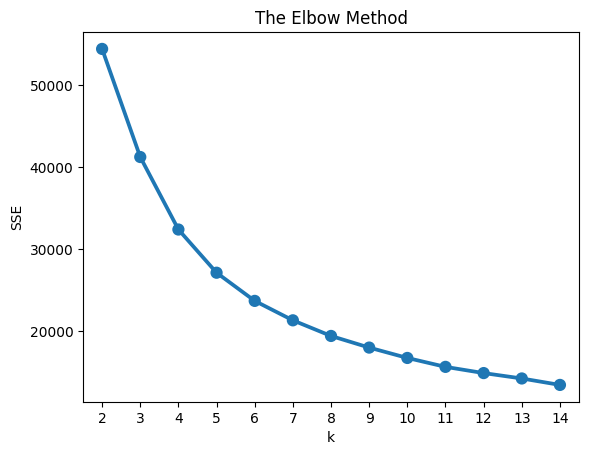

In [16]:
# Add the plot title "The Elbow Method"
plt.title('The Elbow Method')

# Add X-axis label "k"
plt.xlabel('k')

# Add Y-axis label "SSE"
plt.ylabel('SSE')

# Plot SSE values for each key in the dictionary
sns.pointplot(x=list(sse.keys()), y=list(sse.values()))
plt.show()

### 2.2.5 Fit model

In [17]:
data_normalized.head()

,recency_t,frequency,monetary_t
id_customer,,,
a15600,-0.125734,-0.019066,0.830647
a15601,-0.017701,-0.655974,-1.835411
a15602,0.751843,-0.019066,0.911963
a15603,-1.365588,-0.019066,-0.351083
a15604,-1.695724,1.254750,0.710045


In [18]:
# Initialize KMeans
kmeans = KMeans(n_clusters=4, random_state=1) 

# Fit k-means clustering on the normalized data set
kmeans.fit(data_normalized)

# Extract cluster labels
cluster_labels = kmeans.labels_

In [19]:
data_normalized.head()

,recency_t,frequency,monetary_t
id_customer,,,
a15600,-0.125734,-0.019066,0.830647
a15601,-0.017701,-0.655974,-1.835411
a15602,0.751843,-0.019066,0.911963
a15603,-1.365588,-0.019066,-0.351083
a15604,-1.695724,1.254750,0.710045


In [20]:
data_normalized2 = data_normalized.copy()
data_normalized2 = data_normalized2[0:10000]
data_normalized2.shape

(10000, 3)

In [21]:
# Initialize KMedoids
kmedo = KMedoids(n_clusters = 4, random_state=1)
# Fit k-means clustering on the normalized data set
kmedo.fit(data_normalized2)
# Extract cluster labels
cluster_labels_medoids = kmedo.predict(data_normalized)

In [22]:
data_normalized = data_normalized.assign(Cluster=cluster_labels)
data_normalized.head()

,recency_t,frequency,monetary_t,Cluster
id_customer,,,,
a15600,-0.125734,-0.019066,0.830647,3
a15601,-0.017701,-0.655974,-1.835411,1
a15602,0.751843,-0.019066,0.911963,3
a15603,-1.365588,-0.019066,-0.351083,2
a15604,-1.695724,1.254750,0.710045,0


### 2.2.6 Visualize snake plot

In [23]:
# Melt the normalized dataset and reset the index
datamart_melt = pd.melt(data_normalized.reset_index(), 
                        
# Assign CustomerID and Cluster as ID variables
                    id_vars=['id_customer', 'Cluster'],

# Assign RFM values as value variables
                    value_vars=['recency_t', 'frequency', 'monetary_t'],
                        
# Name the variable and value
                    var_name='Metric', value_name='Value'
					)

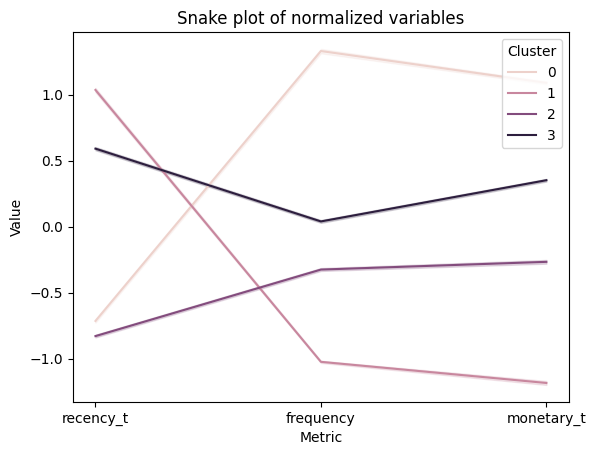

In [24]:
# Add the plot title
plt.title('Snake plot of normalized variables')

# Add the x axis label
plt.xlabel('Metric')

# Add the y axis label
plt.ylabel('Value')

# Plot a line for each value of the cluster variable
sns.lineplot(x="Metric", y="Value", hue='Cluster', data=datamart_melt)
plt.show()

In [25]:
data_normalized = data_normalized.assign(Cluster_medoids=cluster_labels_medoids)

In [26]:
data_normalized.head()

,recency_t,frequency,monetary_t,Cluster,Cluster_medoids
id_customer,,,,,
a15600,-0.125734,-0.019066,0.830647,3,1
a15601,-0.017701,-0.655974,-1.835411,1,2
a15602,0.751843,-0.019066,0.911963,3,1
a15603,-1.365588,-0.019066,-0.351083,2,3
a15604,-1.695724,1.254750,0.710045,0,0


In [27]:
fig = px.scatter_3d(data_normalized, x='recency_t', y='frequency', z='monetary_t', color='Cluster',
                    title = 'Segmentation - kmeans',
                    category_orders={'group': ['1','2','3','4','5','6','7','8']},
                    color_discrete_map={'1':'#684cf6','2':'#90dde0','3':'#447FF5','4':'#78e591','5':'#1e5274',
                                        '6':'#FFE343','7':'#9EFF43','8':'#4AC3FF'},
                    labels={'recency_t':'Recency', 
                            'frequency':'Frequency', 
                            'monetary_t':'Monetary', 
                            'group':'Group',
                            'segment':'Segment'
                           }
                   )
fig.show()

In [28]:
fig = px.scatter_3d(data_normalized, x='recency_t', y='frequency', z='monetary_t', color='Cluster_medoids',
                    title = 'Segmentation - kmedois',
                    category_orders={'group': ['1','2','3','4','5','6','7','8']},
                    color_discrete_map={'1':'#684cf6','2':'#90dde0','3':'#447FF5','4':'#78e591','5':'#1e5274',
                                        '6':'#FFE343','7':'#9EFF43','8':'#4AC3FF'},
                    labels={'recency_t':'Recency', 
                            'frequency':'Frequency', 
                            'monetary_t':'Monetary', 
                            'group':'Group',
                            'segment':'Segment'
                           }
                   )
fig.show()

In [29]:
data_normalized['Cluster'].value_counts(normalize=True)

2    0.269543
3    0.255272
0    0.239638
1    0.235547
Name: Cluster, dtype: float64

In [30]:
data_normalized['Cluster_medoids'].value_counts(normalize=True)

2    0.277391
3    0.264786
1    0.230033
0    0.227791
Name: Cluster_medoids, dtype: float64

In [31]:
fig = px.box(data_normalized, y='recency_t', color='Cluster', 
             title = 'Segmentation - kmeans',
             category_orders={'group': ['1','2','3','4','5','6','7','8']},
             color_discrete_map={'1':'#684cf6','2':'#90dde0','3':'#447FF5','4':'#78e591','5':'#1e5274',
                                 '6':'#FFE343','7':'#9EFF43','8':'#4AC3FF'},
             labels={'recency_t':'Recency', 
                     'frequency':'Frequency', 
                     'monetary':'Monetary', 
                     'group':'Group',
                     'segment':'Segment'
                    })
fig.show()

In [32]:
fig = px.box(data_normalized, y='recency_t', color='Cluster_medoids', 
             title = 'Segmentation - kmedoids',
             category_orders={'group': ['1','2','3','4','5','6','7','8']},
             color_discrete_map={'1':'#684cf6','2':'#90dde0','3':'#447FF5','4':'#78e591','5':'#1e5274',
                                 '6':'#FFE343','7':'#9EFF43','8':'#4AC3FF'},
             labels={'recency_t':'Recency', 
                     'frequency':'Frequency', 
                     'monetary':'Monetary', 
                     'group':'Group',
                     'segment':'Segment'
                    })
fig.show()

In [33]:
fig = px.box(data_normalized, y='frequency', color='Cluster', 
             title = 'Segmentation - kmeans',
             category_orders={'group': ['1','2','3','4','5','6','7','8']},
             color_discrete_map={'1':'#684cf6','2':'#90dde0','3':'#447FF5','4':'#78e591','5':'#1e5274',
                                 '6':'#FFE343','7':'#9EFF43','8':'#4AC3FF'},
             labels={'recency':'Recency', 
                     'frequency':'Frequency', 
                     'monetary':'Monetary', 
                     'group':'Group',
                     'segment':'Segment'
                    })
fig.show()

In [34]:
fig = px.box(data_normalized, y='frequency', color='Cluster_medoids', 
             title = 'Segmentation - kmedoids',
             category_orders={'group': ['1','2','3','4','5','6','7','8']},
             color_discrete_map={'1':'#684cf6','2':'#90dde0','3':'#447FF5','4':'#78e591','5':'#1e5274',
                                 '6':'#FFE343','7':'#9EFF43','8':'#4AC3FF'},
             labels={'recency':'Recency', 
                     'frequency':'Frequency', 
                     'monetary':'Monetary', 
                     'group':'Group',
                     'segment':'Segment'
                    })
fig.show()

In [35]:
fig = px.box(data_normalized, y='monetary_t', color='Cluster', 
             title = 'Segmentation - kmeans',
             category_orders={'group': ['1','2','3','4','5','6','7','8']},
             color_discrete_map={'1':'#684cf6','2':'#90dde0','3':'#447FF5','4':'#78e591','5':'#1e5274',
                                 '6':'#FFE343','7':'#9EFF43','8':'#4AC3FF'},
             labels={'recency':'Recency', 
                     'frequency':'Frequency', 
                     'monetary_t':'Monetary', 
                     'group':'Group',
                     'segment':'Segment'
                    })
fig.show()

In [36]:
fig = px.box(data_normalized, y='monetary_t', color='Cluster_medoids', 
             title = 'Segmentation - kmedoids',
             category_orders={'group': ['1','2','3','4','5','6','7','8']},
             color_discrete_map={'1':'#684cf6','2':'#90dde0','3':'#447FF5','4':'#78e591','5':'#1e5274',
                                 '6':'#FFE343','7':'#9EFF43','8':'#4AC3FF'},
             labels={'recency':'Recency', 
                     'frequency':'Frequency', 
                     'monetary_t':'Monetary', 
                     'group':'Group',
                     'segment':'Segment'
                    })
fig.show()

### 2.2.7 Save

In [37]:
save = data_normalized.copy()
save = save.reset_index()
save = save.loc[:,['id_customer', 'Cluster', 'Cluster_medoids']]
save.rename(columns={'id_customer':'customer_id'}, inplace=True)
save.head()

,customer_id,Cluster,Cluster_medoids
0,a15600,3,1
1,a15601,1,2
2,a15602,3,1
3,a15603,2,3
4,a15604,0,0


In [38]:
# save
save.to_parquet(G_models/'df_ks.parquet.gzip', compression='gzip')